## Assignment 2

Shamir Cardenas/vea30

Ch.3 Exercises 2, 9, 10, 12

**Exercise 2**

Carefully explain the differences between the KNN classifier and KNN
regression methods.

My Answer:

The KNN classifier and KNN regression methods are similar in the fact that both utilize the K number of neighboring values closes to the prediction point in order to make a prediction. They differ from each other in the type of responses that they are used for, KNN classifier method being utilized with categorical response variables to assign the prediction point a class and KNN regression method is utilized with quantitative response variables to estimate the numerical value of the response.

**Exercise 9**

This question involves the use of multiple linear regression on the
Auto data set.

## **9(a)** 

Produce a scatterplot matrix which includes all of the variables
in the data set.

In [20]:
#Had to install ISLP
!pip install ISLP

In [135]:
#libraries utilized
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns

from sklearn.preprocessing import scale
import sklearn.linear_model as skl_lm
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
import statsmodels.formula.api as smf
import os

%matplotlib inline




Now that all ISLP and libraries have been imported we can now begin. 

First step is to load the "Auto" dataset. 

In [75]:
os.getcwd()

'/Users/shamircardenas/Documents/STA-6543-9IT-Summer 2025-Predictive Modeling/Assignment 2'

In [94]:
Auto = pd.read_csv('/Users/shamircardenas/Documents/STA-6543-9IT-Summer 2025-Predictive Modeling/Assignment 2/Auto.csv', na_values='?').dropna() 

Auto.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino


I recoded origin column from 1, 2, and 3 to "American," "European," and "Japanses," in order to understand the data clearly.

In [96]:
Auto.origin[Auto.origin == 1] = "American"
Auto.origin[Auto.origin == 2] = "European"
Auto.origin[Auto.origin == 3] = "Japanese"
Auto.head()

/var/folders/wt/20qq2l8j6h3bhs3124vq_2fm0000gn/T/ipykernel_96982/2551991913.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Auto.origin[Auto.origin == 1] = "American"
/var/folders/wt/20qq2l8j6h3bhs3124vq_2fm0000gn/T/ipykernel_96982/25519

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,American,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,American,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,American,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,American,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,American,ford torino


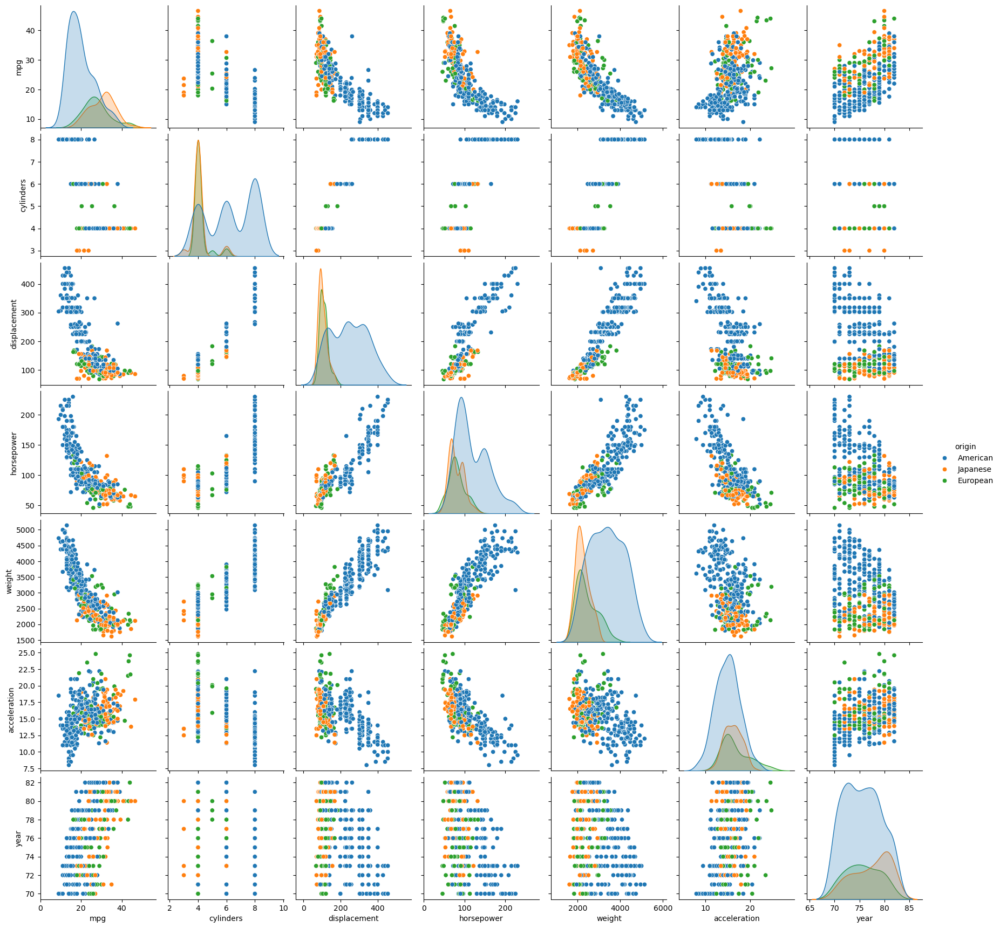

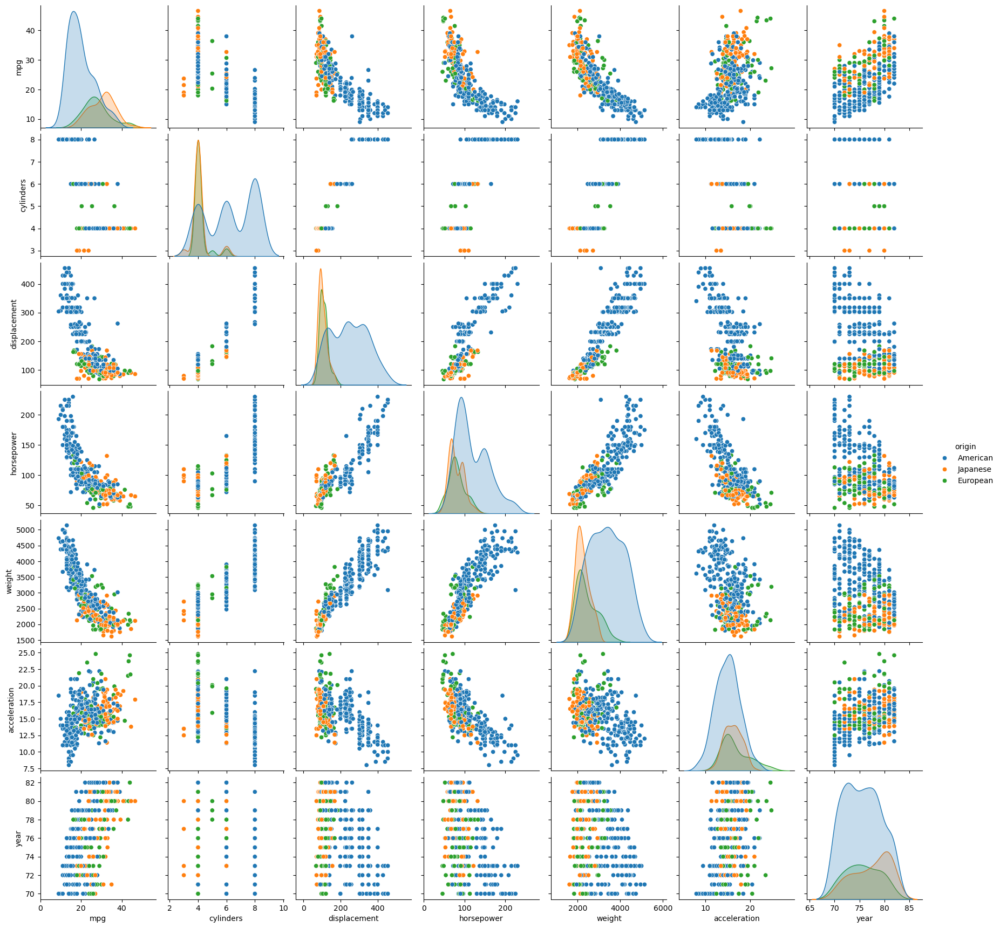

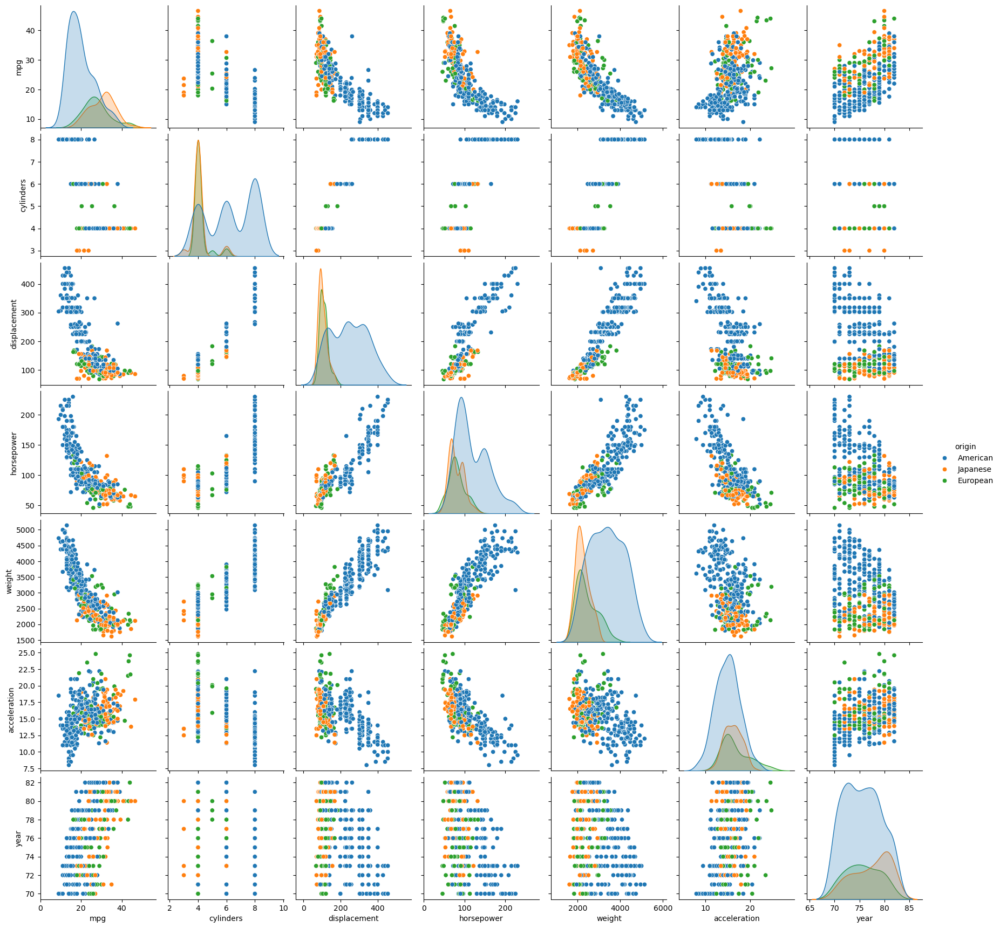

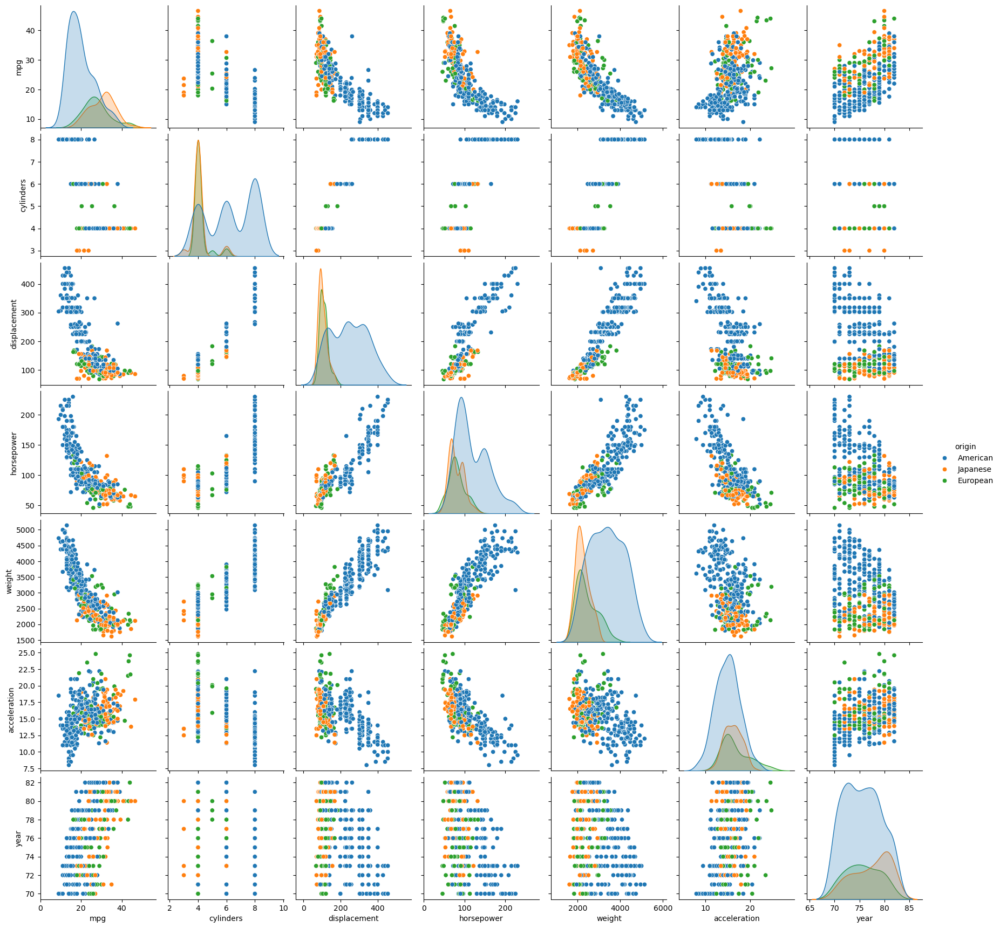

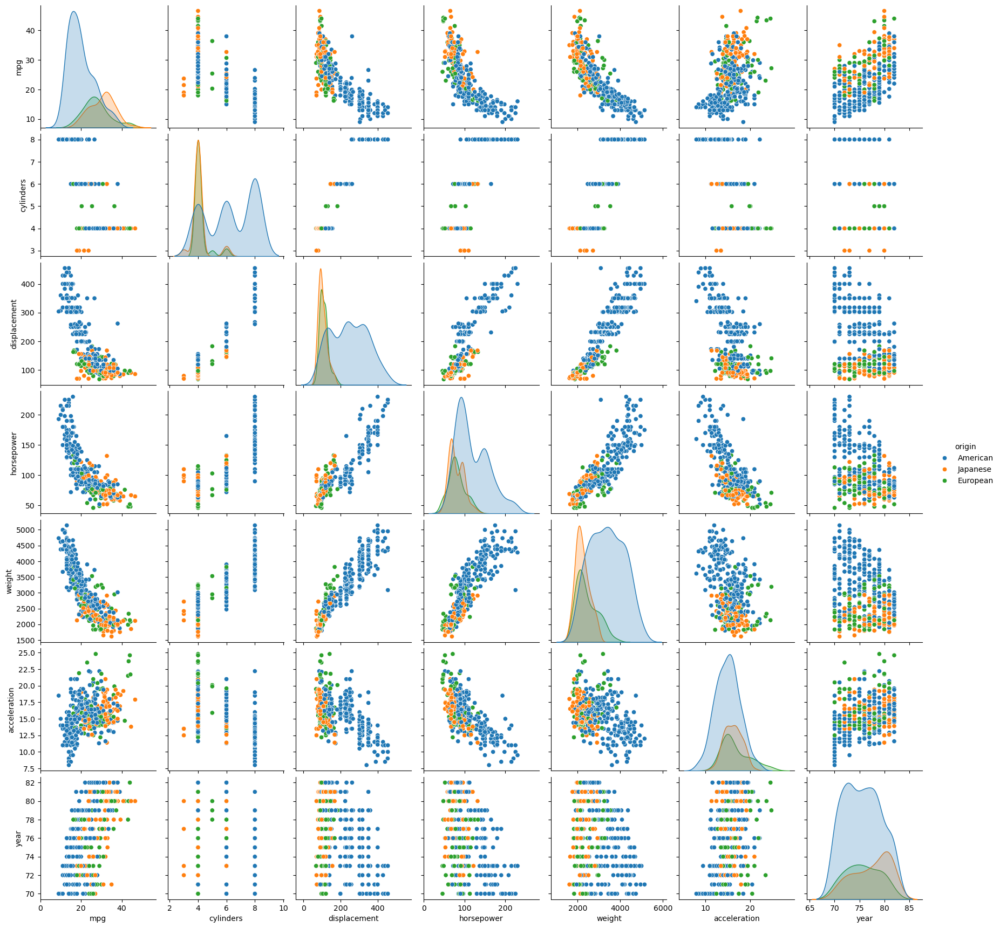

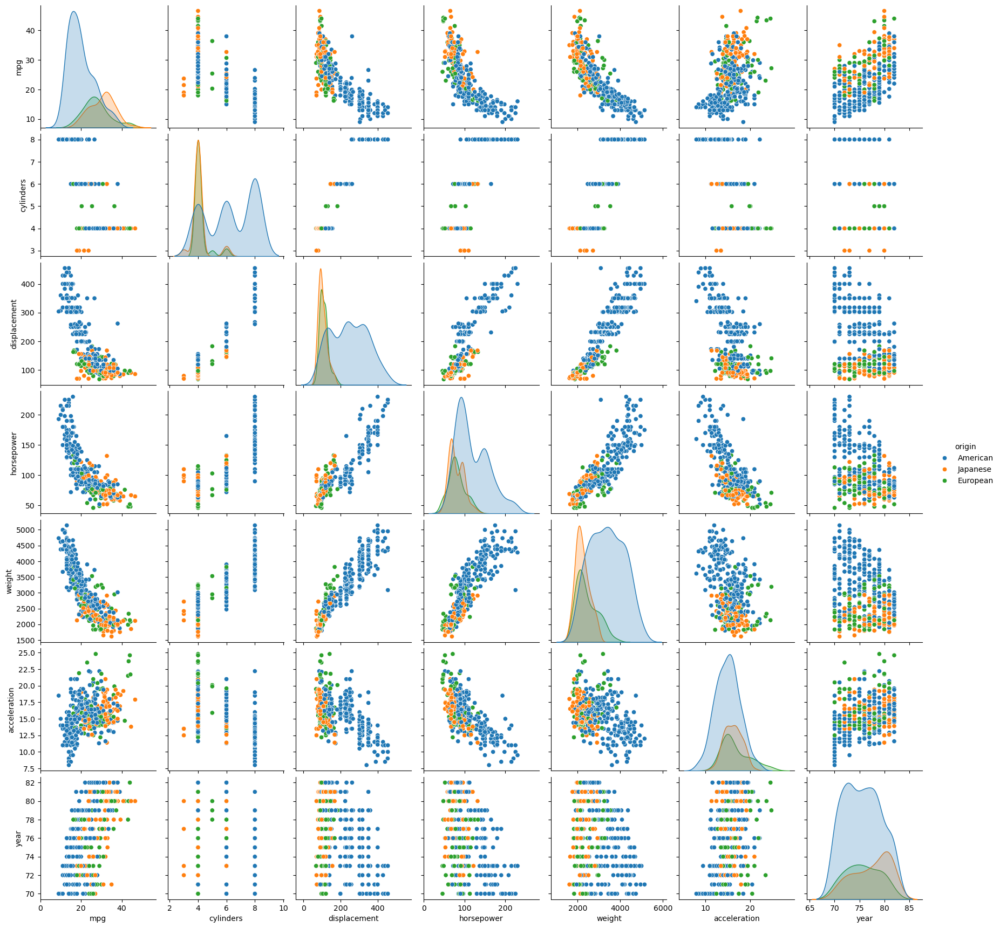

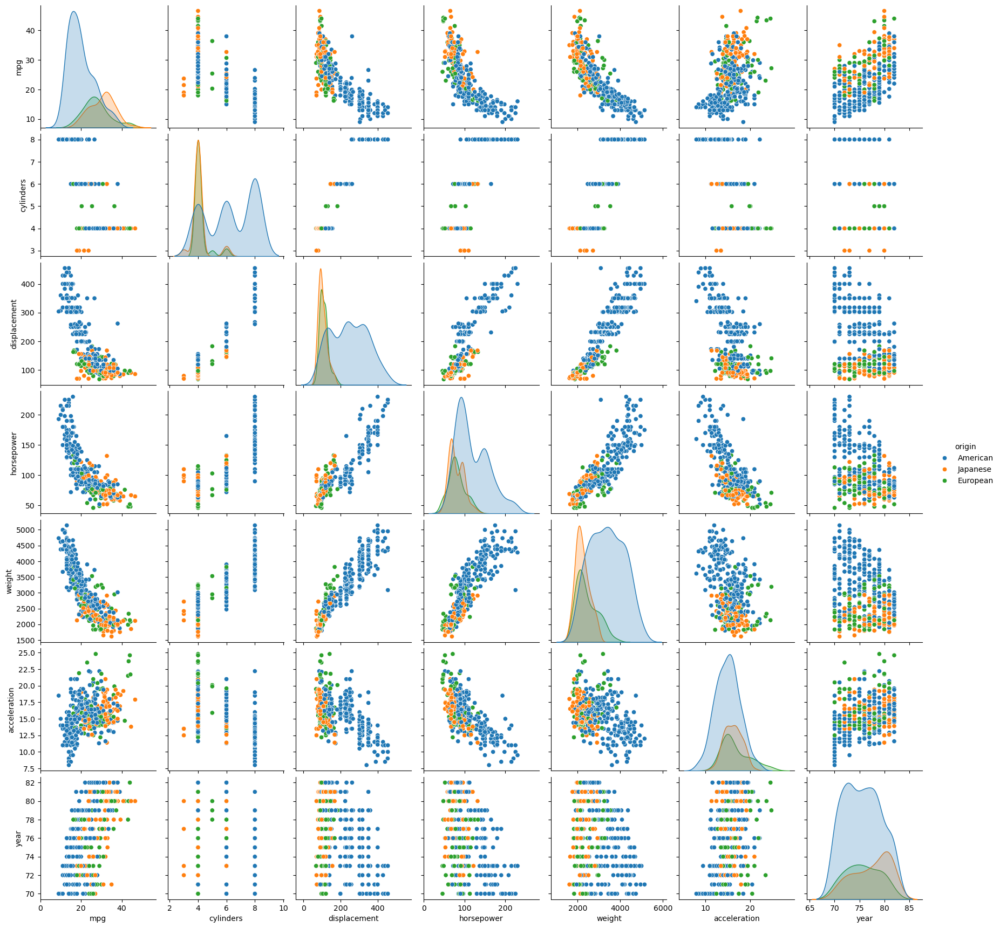

In [126]:
sns.pairplot(Auto, hue="origin")
plt.show()

I ran my plots with hue based on origin to visualize the differences between vehicles from the 3 different countries. 

## **9(b)**

Compute the matrix of correlations between the variables using
the DataFrame.corr() method.

In [142]:
Auto.corr(numeric_only=True)

,mpg,cylinders,displacement,horsepower,weight,acceleration,year
mpg,1.000000,-0.777618,-0.805127,-0.778427,-0.832244,0.423329,0.580541
cylinders,-0.777618,1.000000,0.950823,0.842983,0.897527,-0.504683,-0.345647
displacement,-0.805127,0.950823,1.000000,0.897257,0.932994,-0.543800,-0.369855
horsepower,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361
weight,-0.832244,0.897527,0.932994,0.864538,1.000000,-0.416839,-0.309120
acceleration,0.423329,-0.504683,-0.543800,-0.689196,-0.416839,1.000000,0.290316
year,0.580541,-0.345647,-0.369855,-0.416361,-0.309120,0.290316,1.000000


**9(c)**

Use the sm.OLS() function to perform a multiple linear regression
with mpg as the response and all other variables except name as
the predictors. Use the summarize() function to print the results.
Comment on the output. For instance:

i. Is there a relationship between the predictors and the re-
sponse? Use the anova_lm() function from statsmodels to
answer this question.

ii. Which predictors appear to have a statistically significant
relationship to the response?

iii. What does the coefficient for the year variable suggest?

In [150]:
mod_full=smf.ols("mpg ~cylinders + displacement + horsepower+ weight+acceleration+year+origin",Auto).fit()
mod_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.824
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     224.5
Date:                Wed, 25 Jun 2025   Prob (F-statistic):          1.79e-139
Time:                        17:30:32   Log-Likelihood:                -1020.5
No. Observations:                 392   AIC:                             2059.
Df Residuals:                     383   BIC:                             2095.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            -17.9546      4.677     -3.839      0.000     -27.150      -8.759
origin[T.European]     2.6300      0.566      4.643      0.000       1.516       3.744
origin[T.Japanese]     2.8532      0.553      5.162      0.000       1.766       3.940
cylinders             -0.4897      0.321     -1.524      0.128      -1.121       0.142
displacement           0.0240      0.008      3.133      0.002       0.009       0.039
horsepower            -0.0182      0.014     -1.326      0.185      -0.045       0.009
weight                -0.0067      0.001    -10.243      0.000      -0.008      -0.005
acceleration           0.0791      0.098      0.805      0.421      -0.114       0.272
year                   0.7770      0.052     15.005      0.000       0.675       0.879
==============================================================================
Omnibus:                       23.395   Durbin-Watson:                   1.291
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.452
Skew:                           0.444   Prob(JB):                     3.30e-08
Kurtosis:                       4.150   Cond. No.                     8.70e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.7e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**My Answer:**

With an F-Statistic well above one at **224.5** and a p-value that is essentially zero, it is safe to assume that yes there is a relationship between these predictors and the response variable. The adjusted Rsquared indicates that our current mix explains 82.1% of the variance in the response variable. Statistically significant predictors of **MPG** include **year**, **weight**, **displacement**, and being manufactured in **Japan** or **Europe**. 

The .777 coefficient for **year** suggest that holding all other varialbes constant, each additional year is associated with an increase of **.777 MPG** on average. This implys that newer cars tend to be more fuel efficient. 

## **9(d)**

Produce some of diagnostic plots of the linear regression fit as
described in the lab. Comment on any problems you see with the
fit. Do the residual plots suggest any unusually large outliers?
Does the leverage plot identify any observations with unusually
high leverage?

In [156]:
results = pd.DataFrame({'name': Auto.name,
                        'resids': mod_full.resid,
                        'std_resids': mod_full.resid_pearson,
                        'fitted': mod_full.predict()})
results.head()

,name,resids,std_resids,fitted
0,chevrolet chevelle malibu,3.046748,0.921434,14.953252
1,buick skylark 320,0.959902,0.290305,14.040098
2,plymouth satellite,2.769449,0.837570,15.230551
3,amc rebel sst,1.005916,0.304221,14.994084
4,ford torino,2.098059,0.634520,14.901941


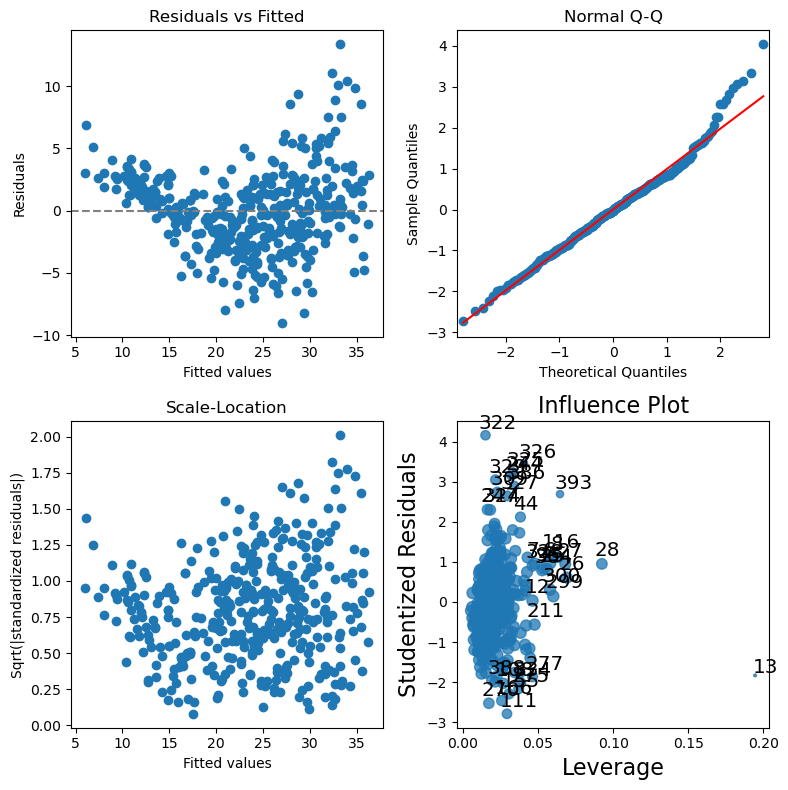

In [178]:
fig = plt.figure(figsize = (8, 8), dpi = 100)

ax1 = fig.add_subplot(2, 2, 1)
ax1.plot(results['fitted'], results['resids'],  'o')
l = plt.axhline(y = 0, color = 'grey', linestyle = 'dashed')
ax1.set_xlabel('Fitted values')
ax1.set_ylabel('Residuals')
ax1.set_title('Residuals vs Fitted')

ax2 = fig.add_subplot(2, 2, 2)
sm.qqplot(results['std_resids'], line='s', ax = ax2)
ax2.set_title('Normal Q-Q')

ax3 = fig.add_subplot(2, 2, 3)
ax3.plot(results['fitted'], abs(results['std_resids'])**.5,  'o')
ax3.set_xlabel('Fitted values')
ax3.set_ylabel('Sqrt(|standardized residuals|)')
ax3.set_title('Scale-Location')

ax4 = fig.add_subplot(2, 2, 4)
sm.graphics.influence_plot(mod_full, criterion = 'Cooks', size = 2, ax = ax4)

plt.tight_layout()
fig.savefig('regplots.png')
plt.show()

**My Answer:**

Looking at the U-shape in the Residuals vs Fitted plot, we can assume that there might be non-linearity in the data. The Residual vs Leverage plot highlights a few key issues. Several observations have standardized residuals with absolute values ≥ 3, indicating possible outliers. This is supported by the Scale-Location plot, where high values on the y-axis further confirm the presence of outliers.

Additionally, the Residuals vs. Leverage plot shows a couple of points with unusually high leverage. Since the dataset has 392 observations after removing missing values, the average leverage is approximately 1/392 ≈ 0.00255. One point stands out with a leverage of about 0.10 (nearly 5 times the average), and another around 0.20 (about 10 times the average), both of which warrant further attention.

## **9(e)**

Fit some models with interactions as described in the lab. Do
any interactions appear to be statistically significant?


In [192]:
columns = "+".join(Auto.columns.drop(["mpg", "name"]))
formula = "mpg ~ (" + columns + ")**2"
mod_all_interactions = smf.ols(formula = formula, data = Auto)
res_all_interactions = mod_all_interactions.fit()
res_all_interactions.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.887
Method:                 Least Squares   F-statistic:                     88.34
Date:                Thu, 26 Jun 2025   Prob (F-statistic):          1.74e-153
Time:                        14:55:36   Log-Likelihood:                -916.16
No. Observations:                 392   AIC:                             1904.
Df Residuals:                     356   BIC:                             2047.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          44.0119     51.467      0.855      0.393     -57.206     145.230
origin[T.European]                -35.1651     12.602     -2.790      0.006     -59.949     -10.381
origin[T.Japanese]                -37.6464     14.261     -2.640      0.009     -65.693      -9.599
cylinders                           3.3016      8.187      0.403      0.687     -12.798      19.402
cylinders:origin[T.European]       -0.7210      1.088     -0.662      0.508      -2.861       1.419
cylinders:origin[T.Japanese]        1.2256      1.007      1.217      0.224      -0.755       3.206
displacement                       -0.3529      0.197     -1.788      0.075      -0.741       0.035
displacement:origin[T.European]    -0.0336      0.042     -0.797      0.426      -0.117       0.049
displacement:origin[T.Japanese]     0.0538      0.041      1.297      0.196      -0.028       0.135
horsepower                          0.5312      0.339      1.567      0.118      -0.135       1.198
horsepower:origin[T.European]      -0.0049      0.051     -0.096      0.923      -0.104       0.095
horsepower:origin[T.Japanese]       0.0229      0.063      0.366      0.715      -0.100       0.146
weight                             -0.0033      0.018     -0.179      0.858      -0.039       0.033
weight:origin[T.European]           0.0023      0.003      0.848      0.397      -0.003       0.008
weight:origin[T.Japanese]          -0.0045      0.003     -1.292      0.197      -0.011       0.002
acceleration                       -6.0483      2.147     -2.818      0.005     -10.270      -1.827
acceleration:origin[T.European]     0.9234      0.264      3.496      0.001       0.404       1.443
acceleration:origin[T.Japanese]     0.7159      0.326      2.198      0.029       0.075       1.357
year                                0.4833      0.592      0.816      0.415      -0.682       1.648
year:origin[T.European]             0.2932      0.144      2.031      0.043       0.009       0.577
year:origin[T.Japanese]             0.3139      0.148      2.116      0.035       0.022       0.606
cylinders:displacement             -0.0063      0.007     -0.889      0.375      -0.020       0.008
cylinders:horsepower                0.0145      0.025      0.591      0.555      -0.034       0.063
cylinders:weight                    0.0006      0.001      0.631      0.529      -0.001       0.002
cylinders:acceleration              0.3658      0.167      2.189      0.029       0.037       0.695
cylinders:year                     -0.1447      0.097     -1.499      0.135      -0.334       0.045
displacement:horsepower         -5.407e-05      0.000     -0.189      0.850      -0.001       0.001
displacement:weight              2.659e-05   1.45e-05      1.828      0.068   -2.02

After fitting a model with all pairwise interaction terms, several interactions appear to be statistically significant. Specifically, interactions between acceleration and origin (both European and Japanese), year and origin, acceleration and year, and cylinders and acceleration all have p-values below 0.05, indicating that the effect of these predictors on MPG varies depending on the level of other variables. For example, the relationship between acceleration and MPG differs by a car's origin, and the impact of model year on MPG changes based on where the car was manufactured. These significant interactions suggest that incorporating them into the model provides a more nuanced understanding of how the predictors influence fuel efficiency.

In [195]:
#I will now do a backwards stepwise selection. 

mod_backwards_sel = smf.ols(formula = "mpg ~ cylinders + displacement + horsepower + weight + acceleration + \
                            year + origin + cylinders:acceleration + cylinders:year + displacement:weight + \
                            displacement:year + displacement:origin + horsepower:weight + \
                            horsepower:acceleration + horsepower:year + weight:origin + acceleration:year + \
                            acceleration:origin + year:origin", data = Auto)
res_backwards_sel = mod_backwards_sel.fit()
res_backwards_sel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     130.9
Date:                Thu, 26 Jun 2025   Prob (F-statistic):          1.02e-163
Time:                        15:19:13   Log-Likelihood:                -918.70
No. Observations:                 392   AIC:                             1887.
Df Residuals:                     367   BIC:                             1987.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          28.2412     43.440      0.650      0.516     -57.182     113.664
origin[T.European]                -37.8078     10.246     -3.690      0.000     -57.956     -17.660
origin[T.Japanese]                -33.8981     11.388     -2.977      0.003     -56.292     -11.504
cylinders                           6.1030      6.179      0.988      0.324      -6.048      18.254
displacement                       -0.3829      0.132     -2.905      0.004      -0.642      -0.124
displacement:origin[T.European]    -0.0287      0.033     -0.866      0.387      -0.094       0.037
displacement:origin[T.Japanese]     0.1069      0.026      4.038      0.000       0.055       0.159
horsepower                          0.6570      0.253      2.593      0.010       0.159       1.155
weight                             -0.0084      0.001     -5.971      0.000      -0.011      -0.006
weight:origin[T.European]           0.0009      0.002      0.493      0.622      -0.003       0.004
weight:origin[T.Japanese]          -0.0057      0.002     -2.679      0.008      -0.010      -0.002
acceleration                       -4.9699      1.787     -2.781      0.006      -8.484      -1.456
acceleration:origin[T.European]     1.0065      0.182      5.525      0.000       0.648       1.365
acceleration:origin[T.Japanese]     0.8400      0.236      3.555      0.000       0.375       1.305
year                                0.5794      0.530      1.093      0.275      -0.463       1.622
year:origin[T.European]             0.2983      0.132      2.260      0.024       0.039       0.558
year:origin[T.Japanese]             0.2909      0.128      2.281      0.023       0.040       0.542
cylinders:acceleration              0.2326      0.069      3.347      0.001       0.096       0.369
cylinders:year                     -0.1249      0.084     -1.489      0.137      -0.290       0.040
displacement:weight               2.68e-05    5.8e-06      4.622      0.000    1.54e-05    3.82e-05
displacement:year                   0.0037      0.002      2.249      0.025       0.000       0.007
horsepower:weight                -1.79e-05   1.49e-05     -1.200      0.231   -4.73e-05    1.14e-05
horsepower:acceleration            -0.0049      0.003     -1.691      0.092      -0.011       0.001
horsepower:year                    -0.0075      0.003     -2.481      0.014      -0.013      -0.002
acceleration:year                   0.0493      0.022      2.283      0.023       0.007       0.092
==============================================================================
Omnibus:                       55.796   Durbin-Watson:                   1.719
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              178.267
Skew:                           0.621   Prob(J

The results from the regression model with selected interaction terms show a strong overall fit, with an R-squared of 0.895 and an adjusted R-squared of 0.889. Several interaction terms appear to be statistically significant. Notably, displacement:origin[T.Japanese], weight:origin[T.Japanese], acceleration:origin[T.European], and acceleration:origin[T.Japanese] all have very low p-values, suggesting the effects of these variables on MPG differ depending on the car’s origin. Additionally, interactions like displacement:weight, displacement:year, horsepower:year, and acceleration:year are also significant, indicating meaningful combined effects on fuel efficiency. Overall, the inclusion of these interactions improves the explanatory power of the model and highlights important relationships between predictors.

## **9(f)**

Try a few different transformations of the variables, such as
log(X), √X, X2. Comment on your findings.

In [203]:
model1 = smf.ols(formula='mpg ~ horsepower+np.log(weight) +origin', data=Auto).fit()
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.735
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     267.7
Date:                Thu, 26 Jun 2025   Prob (F-statistic):          5.02e-110
Time:                        15:38:41   Log-Likelihood:                -1101.2
No. Observations:                 392   AIC:                             2212.
Df Residuals:                     387   BIC:                             2232.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            154.7100     11.583     13.357      0.000     131.936     177.484
origin[T.European]     0.5812      0.628      0.926      0.355      -0.653       1.815
origin[T.Japanese]     2.0821      0.649      3.208      0.001       0.806       3.358
horsepower            -0.0511      0.010     -5.065      0.000      -0.071      -0.031
np.log(weight)       -15.8872      1.546    -10.276      0.000     -18.927     -12.847
==============================================================================
Omnibus:                       41.863   Durbin-Watson:                   0.891
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               63.190
Skew:                           0.708   Prob(JB):                     1.90e-14
Kurtosis:                       4.366   Cond. No.                     6.39e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In this model, horsepower and the logarithm of weight are both statistically significant predictors of miles per gallon (mpg), with higher horsepower and greater weight associated with lower mpg. The coefficient for Japanese origin is also significant, indicating that, on average, Japanese cars achieve about 2.08 more mpg than the baseline (likely American cars), holding other variables constant. In contrast, the coefficient for European origin is not statistically significant, suggesting no meaningful difference in mpg compared to the baseline group. Overall, the model supports the idea that lighter, less powerful cars, particularly those of Japanese origintend to be more fuel efficient.

In [211]:
model2 = smf.ols(formula='mpg ~ horsepower+np.sqrt(weight) +origin', data=Auto).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.725
Method:                 Least Squares   F-statistic:                     259.1
Date:                Thu, 26 Jun 2025   Prob (F-statistic):          5.10e-108
Time:                        15:48:13   Log-Likelihood:                -1105.9
No. Observations:                 392   AIC:                             2222.
Df Residuals:                     387   BIC:                             2242.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             58.9246      2.496     23.612      0.000      54.018      63.831
origin[T.European]     0.7402      0.633      1.169      0.243      -0.505       1.985
origin[T.Japanese]     2.3634      0.650      3.635      0.000       1.085       3.642
horsepower            -0.0506      0.011     -4.792      0.000      -0.071      -0.030
np.sqrt(weight)       -0.5701      0.059     -9.693      0.000      -0.686      -0.454
==============================================================================
Omnibus:                       38.557   Durbin-Watson:                   0.899
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.386
Skew:                           0.682   Prob(JB):                     9.40e-13
Kurtosis:                       4.237   Cond. No.                     1.52e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.52e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

n this model, both horsepower and the square root of weight are statistically significant predictors of mpg, with negative coefficients indicating that increases in either variable are associated with lower fuel efficiency. The Japanese origin variable is also significant, showing that Japanese cars, on average, get about 2.36 more mpg compared to the baseline group. The European origin variable, however, is not statistically significant. Compared to the previous model using log(weight), this model explains slightly less variance (Rsquared = 0.728), suggesting that log(weight) might provide a better fit than sqrt(weight) when modeling mpg.

In [216]:
model3 = smf.ols(formula='mpg ~ horsepower+np.power(weight,2) +origin', data=Auto).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    mpg   R-squared:                       0.699
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     224.4
Date:                Thu, 26 Jun 2025   Prob (F-statistic):           2.00e-99
Time:                        15:50:59   Log-Likelihood:                -1126.0
No. Observations:                 392   AIC:                             2262.
Df Residuals:                     387   BIC:                             2282.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              35.2724      0.826     42.714      0.000      33.649      36.896
origin[T.European]      1.4803      0.655      2.258      0.024       0.192       2.769
origin[T.Japanese]      3.6126      0.653      5.528      0.000       2.328       4.897
horsepower             -0.0683      0.012     -5.928      0.000      -0.091      -0.046
np.power(weight, 2) -5.921e-07   8.63e-08     -6.863      0.000   -7.62e-07   -4.23e-07
==============================================================================
Omnibus:                       29.572   Durbin-Watson:                   0.953
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.920
Skew:                           0.629   Prob(JB):                     1.58e-08
Kurtosis:                       3.785   Cond. No.                     5.07e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.07e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In this model using horsepower, a quadratic transformation of weight, and origin, all predictors are statistically significant. Horsepower and squared weight both have negative coefficients, indicating they are associated with lower mpg, while cars of European and especially Japanese origin are associated with higher mpg. However, the adjusted R-squared is 0.696, which is lower than the previous models using log(weight) (0.730) and sqrt(weight) (0.725), suggesting that modeling weight with a squared transformation results in a worse overall fit.

## **Exercise 10**

This question should be answered using the Carseats data set.

## **10(a)**

Fit a multiple regression model to predict Sales using Price,
Urban, and US.

In [223]:
Carseats = load_data('Carseats')

Carseats.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No


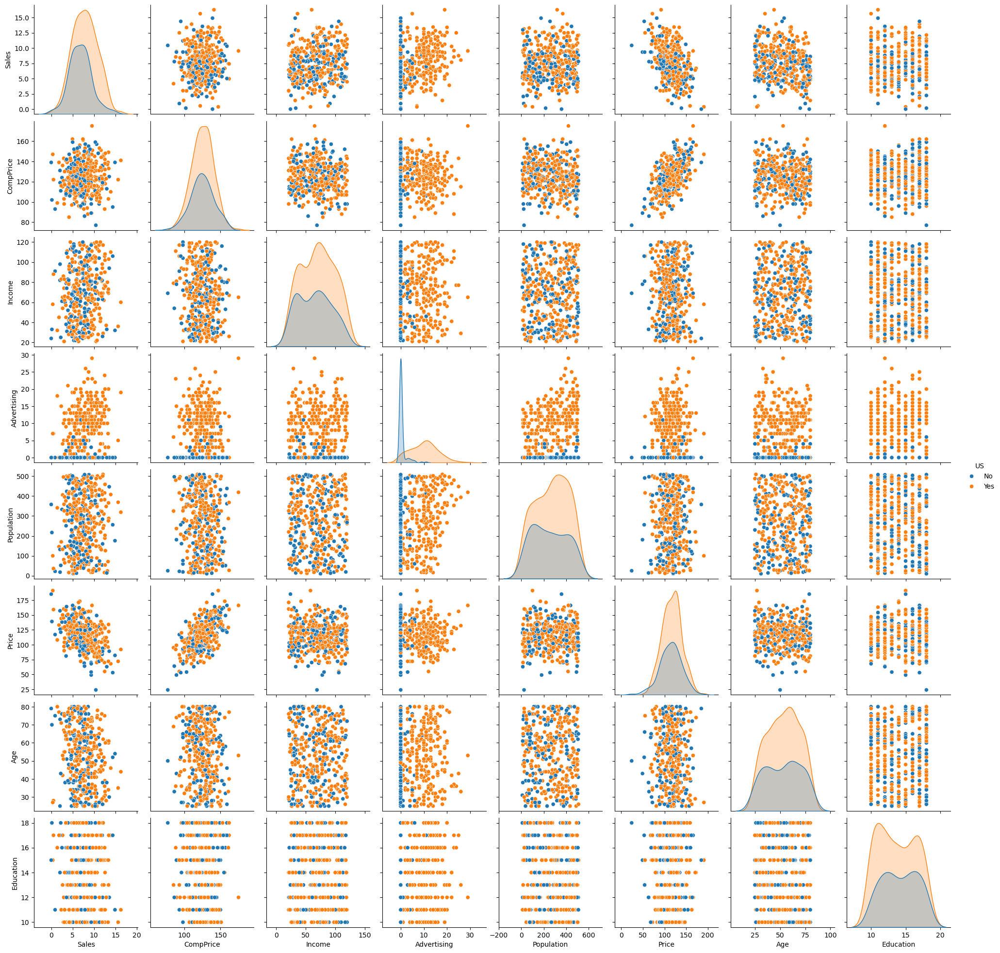

In [225]:
sns.pairplot(Carseats, hue="US")
plt.show()

In [227]:
Car_full=smf.ols("Sales ~Price + Urban + US",Carseats).fit()
Car_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.239
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     41.52
Date:                Thu, 26 Jun 2025   Prob (F-statistic):           2.39e-23
Time:                        16:10:49   Log-Likelihood:                -927.66
No. Observations:                 400   AIC:                             1863.
Df Residuals:                     396   BIC:                             1879.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       13.0435      0.651     20.036      0.000      11.764      14.323
Urban[T.Yes]    -0.0219      0.272     -0.081      0.936      -0.556       0.512
US[T.Yes]        1.2006      0.259      4.635      0.000       0.691       1.710
Price           -0.0545      0.005    -10.389      0.000      -0.065      -0.044
==============================================================================
Omnibus:                        0.676   Durbin-Watson:                   1.912
Prob(Omnibus):                  0.713   Jarque-Bera (JB):                0.758
Skew:                           0.093   Prob(JB):                        0.684
Kurtosis:                       2.897   Cond. No.                         628.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Looking at the results of our model, the overall F-statistic of 41.52 with a p-value near zero suggests a statistically significant relationship between the predictors and Sales. Among the predictors, US[T.Yes] and Price are significant at the 0.05 level, while Urban is not, with a p-value of 0.936. The coefficient for Price is negative, meaning higher prices are associated with lower sales, and US origin is associated with higher sales. However, the adjusted R-squared is only 0.234, meaning the model explains just 23.4% of the variation in Sales, so there’s still a lot of variability not captured by these predictors.

**10(b)**

Provide an interpretation of each coefficient in the model. Be
careful—some of the variables in the model are qualitative!

**My Answer:**

In this model, the intercept of 13.04 suggests that, for stores located outside the US and not in urban areas with a price of zero (the baseline), the expected sales would be around 13 units. The coefficient for Urban[T.Yes] is -0.022, meaning that urban stores are predicted to sell slightly less than non-urban ones, but this difference is not statistically significant (p = 0.936), so we can't draw a strong conclusion about the effect of urban location. The coefficient for US[T.Yes] is 1.20, which is statistically significant (p < 0.001), indicating that stores in the US tend to sell about 1.2 more units than those outside the US, holding other factors constant. Lastly, the Price coefficient is -0.0545, showing a clear and statistically significant negative relationship—sales decrease as price increases, with each $1 increase in price associated with a drop of roughly 0.05 units in sales. Overall, this model highlights that price and US location have meaningful effects on sales, while urban location does not appear to.

**10(d)**

For which of the predictors can you reject the null hypothesis
H0 : βj = 0?

**My Answer:**

Looking at the p-values, we can reject the null hypothesis for US[T.Yes] and Price, but we cannot reject it for Urban[T.Yes].

**10(e)**

On the basis of your response to the previous question, fit a
smaller model that only uses the predictors for which there is
evidence of association with the outcome.

In [266]:
Car_part=smf.ols("Sales ~Price + US",Carseats).fit()
Car_part.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.239
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     62.43
Date:                Mon, 30 Jun 2025   Prob (F-statistic):           2.66e-24
Time:                        10:39:49   Log-Likelihood:                -927.66
No. Observations:                 400   AIC:                             1861.
Df Residuals:                     397   BIC:                             1873.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     13.0308      0.631     20.652      0.000      11.790      14.271
US[T.Yes]      1.1996      0.258      4.641      0.000       0.692       1.708
Price         -0.0545      0.005    -10.416      0.000      -0.065      -0.044
==============================================================================
Omnibus:                        0.666   Durbin-Watson:                   1.912
Prob(Omnibus):                  0.717   Jarque-Bera (JB):                0.749
Skew:                           0.092   Prob(JB):                        0.688
Kurtosis:                       2.895   Cond. No.                         607.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**10(f)**

How well do the models in (a) and (e) fit the data?

**My Answer:**

Model A included three predictors and had an F-statistic of 41.52 with an adjusted R-squared of 0.234, meaning it explains 23.4% of the variability in Sales. Model E used only two predictors and still had a higher F-statistic of 62.43 and a slightly better adjusted R-squared of 0.235, explaining 23.5% of the variability in Sales. Even though Model E is simpler, it performs slightly better in terms of fit. Since both models explain about the same amount of variance, but Model E does so with fewer predictors, it would be considered the better-fitting and more efficient model.

**10(g)**

 Using the model from (e), obtain 95 % confidence intervals for
the coefficient(s).

In [268]:
Car_part.conf_int(alpha=0.05)

,0,1
Intercept,11.79032,14.271265
US[T.Yes],0.69152,1.707766
Price,-0.06476,-0.044195


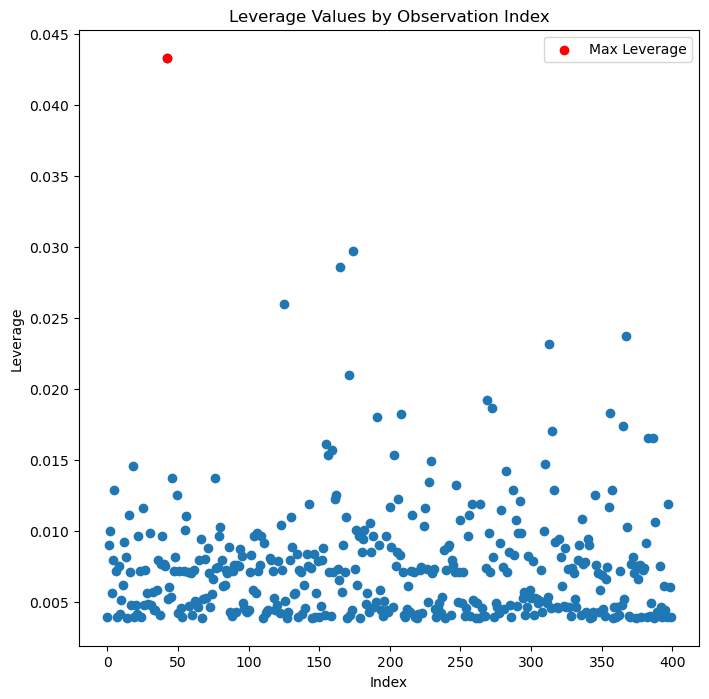

In [278]:
infl = Car_part.get_influence()
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(np.arange(len(Carseats)), infl.hat_matrix_diag)
ax.set_xlabel('Index')
ax.set_ylabel('Leverage')
ax.set_title('Leverage Values by Observation Index')

max_leverage_index = np.argmax(infl.hat_matrix_diag)
ax.scatter(max_leverage_index, infl.hat_matrix_diag[max_leverage_index], color='red', label='Max Leverage')
ax.legend()

plt.show()

In [280]:
n=Carseats.shape[0]
leverage_thres=3/n
leverage_thres

0.0075

**10(h)**

Is there evidence of outliers or high leverage observations in the
model from (e)?

**My Answer:**

Yes, based on the leverage threshold of .0075 I believe that observations =>.03 should be reviewed and considered for removal from dataset. 

## **Exercise 12**

This problem involves simple linear regression without an intercept.

**11(a)**

Recall that the coefficient estimateˆ
β for the linear regression of
Y onto X without an intercept is given by (3.38). Under what
circumstance is the coefficient estimate for the regression of X
onto Y the same as the coefficient estimate for the regression of
Y onto X?

**My Answer:**

The condition of the question becomes true when y and x have the same variance.

**11(b)**

Generate an example in Python with n = 100 observations in
which the coefficient estimate for the regression of X onto Y
is different from the coefficient estimate for the regression of Y
onto X.

In [302]:
x = np.arange(100)
y = x + np.random.normal(size=100)
df=pd.DataFrame({'x':x,'y':y})
#regression of y onto x
X=MS(df[['x']],intercept=False).fit_transform(df)
model=sm.OLS(y,X)
result=model.fit()
summarize(result)

,coef,std err,t,P>|t|
x,1.0002,0.002,528.942,0.0


In [304]:
#regression of x onto y
Y=MS(df[['y']],intercept=False).fit_transform(df)
model_y=sm.OLS(x,Y)
result_y=model_y.fit()
summarize(result_y)

,coef,std err,t,P>|t|
y,0.9995,0.002,528.942,0.0


**10(c)**

Generate an example in Python with n = 100 observations in
which the coefficient estimate for the regression of X onto Y is
the same as the coefficient estimate for the regression of Y onto
X.

In [307]:
x = np.arange(100)
y = x[::-1]
df1=pd.DataFrame({'x':x,'y':y})
#regression of y onto x
X1=MS(df1[['x']],intercept=False).fit_transform(df1)
model1=sm.OLS(y,X1)
result1=model1.fit()
summarize(result1)

,coef,std err,t,P>|t|
x,0.4925,0.087,5.63,0.0


In [309]:
#regression of x onto y
Y1=MS(df[['y']],intercept=False).fit_transform(df1)
model2=sm.OLS(x,Y1)
result2=model2.fit()
summarize(result2)

,coef,std err,t,P>|t|
y,0.4925,0.087,5.63,0.0
